# 08 –  Audio-Based Song Recommendation

## Goal

Build a simple content-based recommendation system that suggests similar songs based on audio features.

Instead of predicting a genre, this notebook compares songs directly using MFCC feature vectors and cosine similarity.

## Why Recommendation Systems?

Previous notebooks focused on classification tasks, where a model predicts the genre of a song.

Recommendation systems address a different problem:

Instead of assigning a label, they identify songs that are similar to a given reference song.

This approach is widely used by music streaming platforms to help users discover new content.

In [25]:
import numpy as np
import pandas as pd
import librosa
from pathlib import Path
import matplotlib.pyplot as plt

from sklearn.metrics.pairwise import cosine_similarity

In [26]:
data_path = Path("../data/raw/gtzan/Data/genres_original")

genres = ["rock", "classical", "jazz", "metal"]
samples_per_genre = 30

In [27]:
data_path = Path("../data/raw/gtzan/Data/genres_original")

## Feature Representation

To compare songs, we first need a numerical representation of their audio content.

As in previous notebooks, we use MFCC features to summarize the spectral characteristics of each song.

Songs with similar MFCC representations are expected to sound more alike.

In [28]:
def extract_mfcc_features(file_path, n_mfcc=13):
    y, sr = librosa.load(file_path, sr=22050)

    mfcc = librosa.feature.mfcc(
        y=y,
        sr=sr,
        n_mfcc=n_mfcc
    )

    mfcc_mean = np.mean(mfcc, axis=1)
    mfcc_std = np.std(mfcc, axis=1)

    features = np.concatenate([mfcc_mean, mfcc_std])

    return features

In [29]:
features = []
song_names = []
song_genres = []
song_paths = []

for genre in genres:
    genre_path = data_path / genre
    files = list(genre_path.glob("*.wav"))[:samples_per_genre]

    for file in files:
        feature_vector = extract_mfcc_features(file)

        features.append(feature_vector)
        song_names.append(file.name)
        song_genres.append(genre)
        song_paths.append(file)

features = np.array(features)

print("Feature matrix shape:", features.shape)
print("Number of songs:", len(song_names))

Feature matrix shape: (120, 26)
Number of songs: 120


## Why MFCCs Instead of Mel-Spectrograms?

In the previous notebooks, Mel-spectrograms proved to be highly effective for genre classification, especially when combined with convolutional neural networks.

For this recommendation system, however, we use MFCC features instead.

The main reason is efficiency:

- MFCCs provide a compact representation of each song.
- Similarity calculations become much faster.
- Less memory is required to store the feature vectors.

While Mel-spectrograms preserve more information, MFCCs often capture enough spectral characteristics to identify acoustically similar songs.

For a small content-based recommendation system, this trade-off between information content and computational efficiency is reasonable.

In [30]:
song_database = pd.DataFrame({
    "song_name": song_names,
    "genre": song_genres,
    "path": song_paths
})

song_database.head()

,song_name,genre,path
0,rock.00083.wav,rock,../data/raw/gtzan/Data/genres_original/rock/ro...
1,rock.00079.wav,rock,../data/raw/gtzan/Data/genres_original/rock/ro...
2,rock.00015.wav,rock,../data/raw/gtzan/Data/genres_original/rock/ro...
3,rock.00038.wav,rock,../data/raw/gtzan/Data/genres_original/rock/ro...
4,rock.00058.wav,rock,../data/raw/gtzan/Data/genres_original/rock/ro...


## Measuring Song Similarity

Once feature vectors have been extracted, we compute pairwise similarities between all songs.

We use cosine similarity, which measures how similar two feature vectors are regardless of their absolute magnitude.

Values close to 1 indicate highly similar songs, while values close to 0 indicate little similarity.

In [31]:
similarity_matrix = cosine_similarity(features)

print("Similarity matrix shape:", similarity_matrix.shape)

Similarity matrix shape: (120, 120)


## Similarity Matrix

The similarity matrix contains a similarity score for every pair of songs in the dataset.

Each row represents one song and stores its similarity to all other songs.

This matrix forms the foundation of the recommendation system.

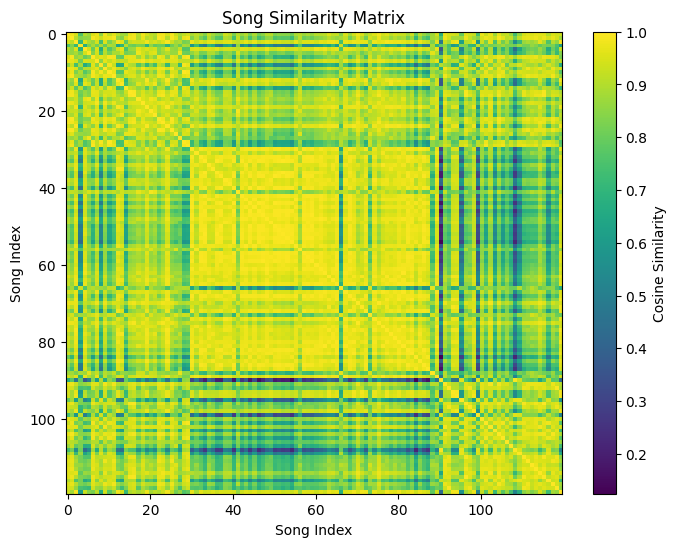

In [38]:
plt.figure(figsize=(8,6))
plt.imshow(similarity_matrix, aspect="auto")
plt.colorbar(label="Cosine Similarity")
plt.title("Song Similarity Matrix")
plt.xlabel("Song Index")
plt.ylabel("Song Index")
plt.show()

Songs that appear as bright regions in the matrix share similar audio characteristics.

The diagonal is always equal to 1 because every song is perfectly similar to itself.

The similarity calculations are performed on MFCC feature vectors rather than full Mel-spectrograms.

This greatly reduces computational complexity while still preserving important timbral information.

In [32]:
def recommend_songs(song_index, top_n=5):
    similarities = similarity_matrix[song_index]

    sorted_indices = np.argsort(similarities)[::-1]

    recommendations = []

    for idx in sorted_indices:
        if idx == song_index:
            continue

        recommendations.append({
            "song_name": song_names[idx],
            "genre": song_genres[idx],
            "similarity": similarities[idx]
        })

        if len(recommendations) == top_n:
            break

    return pd.DataFrame(recommendations)

## Surprising Recommendations

Recommendation systems do not understand genres.

They only compare numerical audio features.

As a result, songs from different genres can occasionally be considered similar if their acoustic characteristics overlap.

This sometimes leads to unexpected recommendations, such as a jazz song appearing among recommendations for a rock track.

In [33]:
from IPython.display import Audio, display

def play_recommendations(song_index, top_n=5):

    print("Selected song:")
    print(song_database.iloc[song_index][["song_name", "genre"]])

    display(Audio(str(song_database.iloc[song_index]["path"])))

    recommendations = recommend_songs(song_index, top_n=top_n)

    print("\nRecommended songs:")
    display(recommendations)

    for _, row in recommendations.iterrows():

        song_path = song_database[
            song_database["song_name"] == row["song_name"]
        ]["path"].iloc[0]

        print(
            f'{row["song_name"]} | '
            f'Genre: {row["genre"]} | '
            f'Similarity: {row["similarity"]:.3f}'
        )

        display(Audio(str(song_path)))

## Top Recommendations

In [34]:
play_recommendations(
    song_index=0,
    top_n=5
)

Selected song:
song_name    rock.00083.wav
genre                  rock
Name: 0, dtype: object



Recommended songs:


,song_name,genre,similarity
0,rock.00084.wav,rock,0.988257
1,rock.00080.wav,rock,0.985142
2,jazz.00034.wav,jazz,0.984060
3,rock.00064.wav,rock,0.983484
4,rock.00075.wav,rock,0.982956


rock.00084.wav | Genre: rock | Similarity: 0.988


rock.00080.wav | Genre: rock | Similarity: 0.985


jazz.00034.wav | Genre: jazz | Similarity: 0.984


rock.00064.wav | Genre: rock | Similarity: 0.983


rock.00075.wav | Genre: rock | Similarity: 0.983


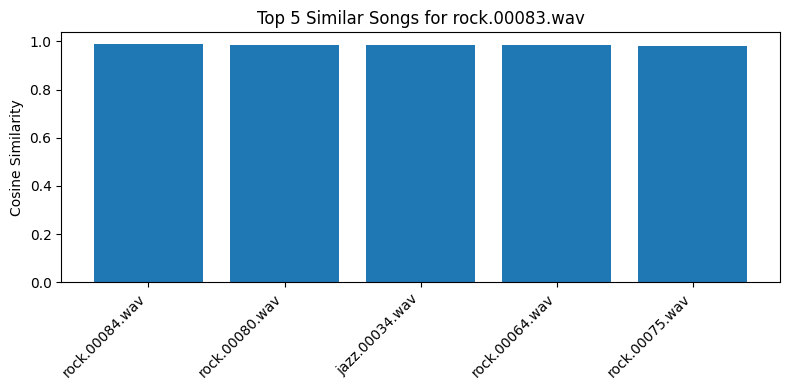

In [35]:
selected_song_index = 0

recommendations = recommend_songs(
    selected_song_index,
    top_n=5
)

plt.figure(figsize=(8,4))

plt.bar(
    recommendations["song_name"],
    recommendations["similarity"]
)

plt.ylabel("Cosine Similarity")

plt.title(
    f"Top 5 Similar Songs for "
    f"{song_names[selected_song_index]}"
)

plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

## Recommendation Diversity

The genre distribution of the recommendations provides insight into how diverse the suggested songs are.

If recommendations come exclusively from one genre, the system may be focusing strongly on genre-specific characteristics.

A more diverse distribution can indicate that similarities are based on broader musical properties.

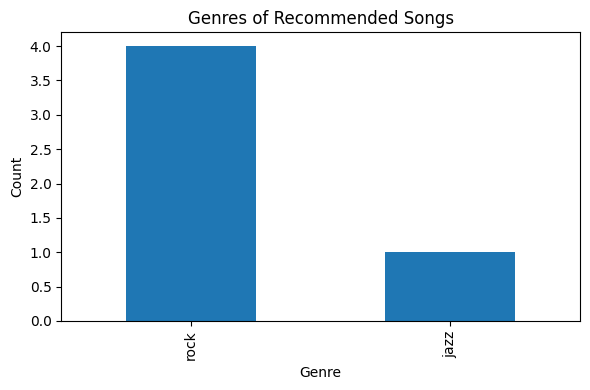

In [36]:
recommendations["genre"].value_counts().plot(
    kind="bar",
    figsize=(6,4)
)

plt.title("Genres of Recommended Songs")
plt.xlabel("Genre")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

In [37]:
for idx in [0, 30, 60, 90]:

    print("=" * 60)

    print("Selected song:")
    print(
        song_database.iloc[idx][
            ["song_name", "genre"]
        ]
    )

    display(
        recommend_songs(
            idx,
            top_n=5
        )
    )

Selected song:
song_name    rock.00083.wav
genre                  rock
Name: 0, dtype: object


,song_name,genre,similarity
0,rock.00084.wav,rock,0.988257
1,rock.00080.wav,rock,0.985142
2,jazz.00034.wav,jazz,0.984060
3,rock.00064.wav,rock,0.983484
4,rock.00075.wav,rock,0.982956


Selected song:
song_name    classical.00013.wav
genre                  classical
Name: 30, dtype: object


,song_name,genre,similarity
0,jazz.00001.wav,jazz,0.996425
1,classical.00072.wav,classical,0.995526
2,classical.00040.wav,classical,0.994430
3,classical.00037.wav,classical,0.994336
4,classical.00017.wav,classical,0.994093


Selected song:
song_name    jazz.00009.wav
genre                  jazz
Name: 60, dtype: object


,song_name,genre,similarity
0,jazz.00004.wav,jazz,0.990807
1,classical.00035.wav,classical,0.987012
2,classical.00087.wav,classical,0.986284
3,classical.00097.wav,classical,0.986262
4,jazz.00070.wav,jazz,0.985957


Selected song:
song_name    metal.00048.wav
genre                  metal
Name: 90, dtype: object


,song_name,genre,similarity
0,metal.00047.wav,metal,0.991048
1,metal.00059.wav,metal,0.963667
2,metal.00084.wav,metal,0.962927
3,metal.00083.wav,metal,0.933264
4,metal.00077.wav,metal,0.922314


## Listening-Based Evaluation

To better evaluate the recommendation system, the selected song and its recommended songs can be played directly in the notebook.

This allows a qualitative check of whether numerically similar songs also sound similar to a human listener.

## Observations

- A content-based recommendation system was implemented using MFCC features.
- Each song is represented as a numerical feature vector.
- Cosine similarity enables comparison between songs without requiring genre labels.
- The recommendation system successfully retrieves acoustically similar songs.
- Most recommendations belong to the same genre as the reference song.
- Some recommendations cross genre boundaries, highlighting similarities that are not captured by genre labels alone.
- Listening tests suggest that the retrieved songs often share noticeable musical characteristics.

## Interpretation

Unlike classification models, recommendation systems focus on similarity rather than category prediction.

The appearance of cross-genre recommendations demonstrates that audio similarity is more nuanced than genre labels alone.

This highlights both a strength and a limitation of content-based recommendation systems:

- They can discover unexpected relationships between songs.
- They may recommend songs that are technically similar but not necessarily preferred by listeners.

## Week 8 Summary

This week extends the project from classification to recommendation.

Unlike the CNN-based classification approach from Week 6, this recommendation system uses MFCC features.

This demonstrates that different machine learning tasks may benefit from different feature representations depending on their goals and computational requirements.

We:

- extracted MFCC features from audio files
- computed pairwise song similarities
- built a content-based recommendation system
- generated recommendations using cosine similarity
- evaluated recommendations through visualization and listening tests

The results demonstrate that audio features can be used not only for classification but also for discovering relationships between songs.

This notebook represents the first user-facing application developed during the project.